In [1]:
# Author: Swapnil Acharya
# Date: 8/12/2021

# Intel Image Classifcation
**kaggle link**: https://www.kaggle.com/puneet6060/intel-image-classification

Description
Context

This is image data of Natural Scenes around the world.
Content

This Data contains around 25k images of size 150x150 distributed under 6 categories.
{'buildings' -> 0,
'forest' -> 1,
'glacier' -> 2,
'mountain' -> 3,
'sea' -> 4,
'street' -> 5 }

The Train, Test and Prediction data is separated in each zip files. There are around 14k images in Train, 3k in Test and 7k in Prediction.
This data was initially published on https://datahack.analyticsvidhya.com by Intel to host a Image classification Challenge.
Acknowledgements

Thanks to https://datahack.analyticsvidhya.com for the challenge and Intel for the Data

Photo by Jan Böttinger on Unsplash
Inspiration

Want to build powerful Neural network that can classify these images with more accuracy.

In [2]:
!pip install tensorflow-addons #for f1 score

     |████████████████████████████████| 679 kB 7.9 MB/s 


## References

1.   https://www.tensorflow.org/guide/keras/writing_a_training_loop_from_scratch

2.   https://www.tensorflow.org/tutorials/quickstart/advanced

3. https://www.tensorflow.org/tutorials/images/transfer_learning


## Import Libraries

In [3]:
import tensorflow as tf
import numpy as np
import cv2
from matplotlib import pyplot as plt
import os
import time
import tensorflow_addons as tfa
from sklearn.metrics import f1_score
from google.colab.patches import cv2_imshow

In [4]:
tf.__version__

'2.5.0'

## Download and Prepare data from Kaggle

In [5]:
os.environ['KAGGLE_USERNAME'] = "hellosomeone" # username from the json file
os.environ['KAGGLE_KEY'] = "9de45792bb324a2134b4d832ce808ea8" # key from the json file

In [7]:
#!printenv

In [8]:
!kaggle datasets download -d puneet6060/intel-image-classification #download data from kaggle

 98% 340M/346M [00:02<00:00, 154MB/s]
100% 346M/346M [00:02<00:00, 148MB/s]


In [9]:
!ls

intel-image-classification.zip	sample_data


In [10]:
!mkdir dataset

In [11]:
!unzip -q intel-image-classification.zip -d dataset/

In [12]:
!ls

dataset  intel-image-classification.zip  sample_data


In [13]:
!ls dataset/

seg_pred  seg_test  seg_train


In [14]:
!ls dataset/seg_train/seg_train/

buildings  forest  glacier  mountain  sea  street


In [15]:
TRAIN_DATA_DIR = 'dataset/seg_train/seg_train/'
VALID_DATA_DIR = 'dataset/seg_test/seg_test/'
TEST_DATA_DIR = 'dataset/seg_pred/seg_pred/'

In [16]:
#get class distribution of data in training set
train_class_distribution = {}

for dir in os.listdir(TRAIN_DATA_DIR):
  train_class_distribution[dir] = len(os.listdir(os.path.join(TRAIN_DATA_DIR,dir)))

train_class_distribution

{'buildings': 2191,
 'forest': 2271,
 'glacier': 2404,
 'mountain': 2512,
 'sea': 2274,
 'street': 2382}

In [17]:
#get class distribution of data in valid set
valid_class_distribution = {}

for dir in os.listdir(VALID_DATA_DIR):
  valid_class_distribution[dir] = len(os.listdir(os.path.join(VALID_DATA_DIR,dir)))

valid_class_distribution

{'buildings': 437,
 'forest': 474,
 'glacier': 553,
 'mountain': 525,
 'sea': 510,
 'street': 501}

## Create Train And Valid Tensorflow Dataset

In [18]:
BATCH_SIZE = 32
IMG_HEIGHT = 150
IMG_WIDTH = 150
SEED_VAL = 123

In [19]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(directory=TRAIN_DATA_DIR,
                                                               labels='inferred',
                                                               batch_size=BATCH_SIZE,
                                                               image_size=(IMG_HEIGHT,IMG_WIDTH),
                                                               validation_split=None,
                                                               seed=SEED_VAL)

Found 14034 files belonging to 6 classes.


In [20]:
valid_ds = tf.keras.preprocessing.image_dataset_from_directory(directory=VALID_DATA_DIR,
                                                               labels='inferred',
                                                               batch_size=BATCH_SIZE,
                                                               image_size=(IMG_HEIGHT,IMG_WIDTH),
                                                               validation_split=None,
                                                               seed=SEED_VAL)

Found 3000 files belonging to 6 classes.


In [21]:
class_names = train_ds.class_names
class_names

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

In [22]:
valid_ds.class_names

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

In [23]:
images_list = []

for file in os.listdir(TEST_DATA_DIR):
  img_ar = cv2.imread(os.path.join(TEST_DATA_DIR,file))
  img_ar = cv2.cvtColor(img_ar,cv2.COLOR_BGR2RGB)
  img_ar = cv2.resize(img_ar,(IMG_HEIGHT,IMG_WIDTH))
  images_list.append(img_ar)

images_list= np.stack(images_list,axis=0)

## Create Test Tensorflow Dataset

In [24]:
images_list = []

for file in os.listdir(TEST_DATA_DIR):
  img_ar = cv2.imread(os.path.join(TEST_DATA_DIR,file))
  img_ar = cv2.cvtColor(img_ar,cv2.COLOR_BGR2RGB)
  img_ar = cv2.resize(img_ar,(IMG_HEIGHT,IMG_WIDTH))
  images_list.append(img_ar)

images_list= np.stack(images_list,axis=0)

In [25]:
images_list.shape

(7301, 150, 150, 3)

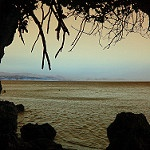

In [26]:
cv2_imshow(images_list[0])

In [27]:
prediction_set = tf.data.Dataset.from_tensor_slices(images_list)

In [28]:
prediction_set

<TensorSliceDataset shapes: (150, 150, 3), types: tf.uint8>

In [29]:
prediction_batch_set = prediction_set.batch(BATCH_SIZE)

In [30]:
prediction_batch_set

<BatchDataset shapes: (None, 150, 150, 3), types: tf.uint8>

## Explore Data

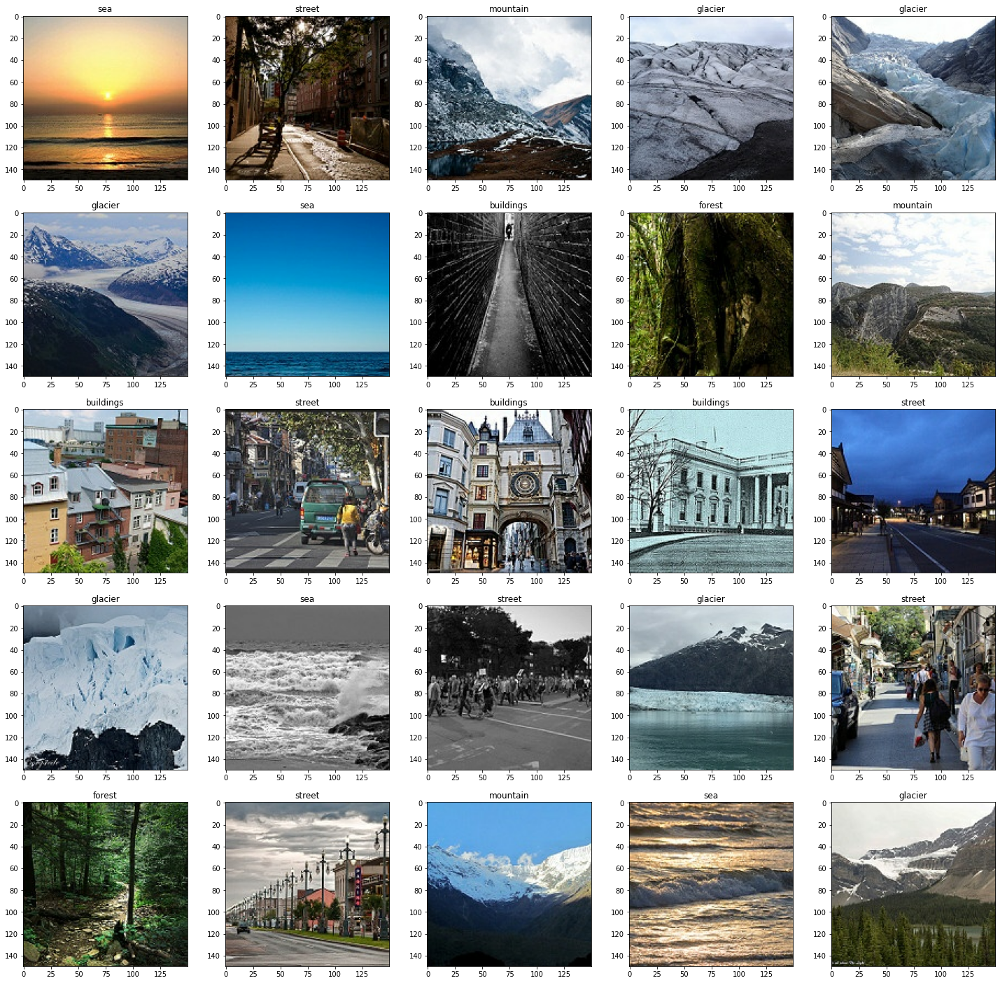

In [31]:
#plot some images in training set
images, labels = next(iter(train_ds))

fig, ax = plt.subplots(5,5,figsize=(25,25))

for index, a in enumerate(fig.axes):
  a.imshow(np.array(images[index],dtype=np.uint8))
  a.title.set_text(class_names[labels[index]])

plt.show()

## View Class Balance In Training Set

In [32]:
#get names of classe and their counts
names = []
counts = []
for key in train_class_distribution.keys():
  names.append(key)
  counts.append(train_class_distribution[key])

(names,counts)

(['buildings', 'sea', 'mountain', 'forest', 'street', 'glacier'],
 [2191, 2274, 2512, 2271, 2382, 2404])

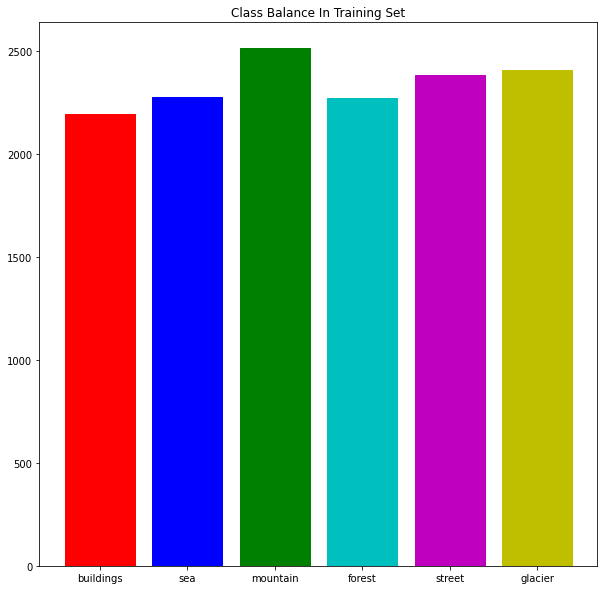

In [33]:
#bar plot class distribution
fig, ax = plt.subplots(1,1,figsize=(10,10))
ax.bar(names,counts)
ax.title.set_text("Class Balance In Training Set")
ax.get_children()[0].set_color('r')
ax.get_children()[1].set_color('b')
ax.get_children()[2].set_color('g')
ax.get_children()[3].set_color('c')
ax.get_children()[4].set_color('m')
ax.get_children()[5].set_color('y')
plt.show()

**Looks like dataset is not balanced**

## View Class Balance In Validation Set

In [34]:
#get names of classe and their counts
names = []
counts = []
for key in valid_class_distribution.keys():
  names.append(key)
  counts.append(valid_class_distribution[key])


(names,counts)

(['buildings', 'sea', 'mountain', 'forest', 'street', 'glacier'],
 [437, 510, 525, 474, 501, 553])

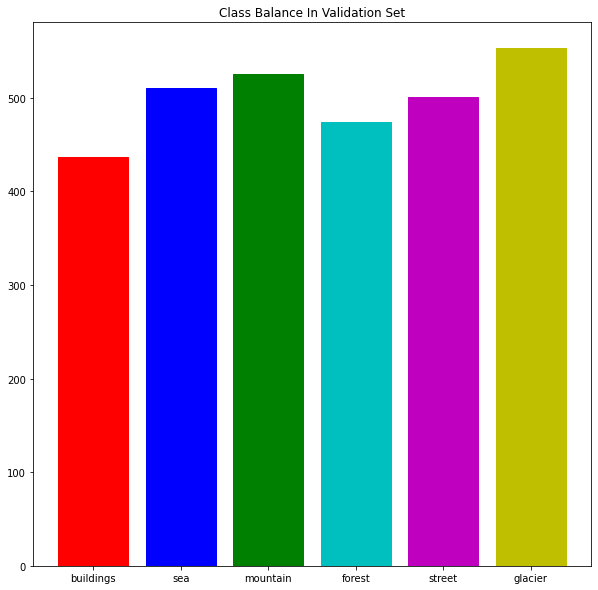

In [35]:
#bar plot class distribution
fig, ax = plt.subplots(1,1,figsize=(10,10))
ax.bar(names,counts)
ax.title.set_text("Class Balance In Validation Set")
ax.get_children()[0].set_color('r')
ax.get_children()[1].set_color('b')
ax.get_children()[2].set_color('g')
ax.get_children()[3].set_color('c')
ax.get_children()[4].set_color('m')
ax.get_children()[5].set_color('y')
plt.show()

## Configure Dataset For Performance

In [36]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
valid_ds = valid_ds.prefetch(buffer_size=AUTOTUNE)

## Use Data Augmentation

### Create Augmentation Layer

In [37]:
augment_layer = tf.keras.Sequential([
                                     tf.keras.layers.experimental.preprocessing.RandomFlip(mode='horizontal_and_vertical'),
                                     tf.keras.layers.experimental.preprocessing.RandomRotation(0.2)
])

### Visualize Augmentation Outputs

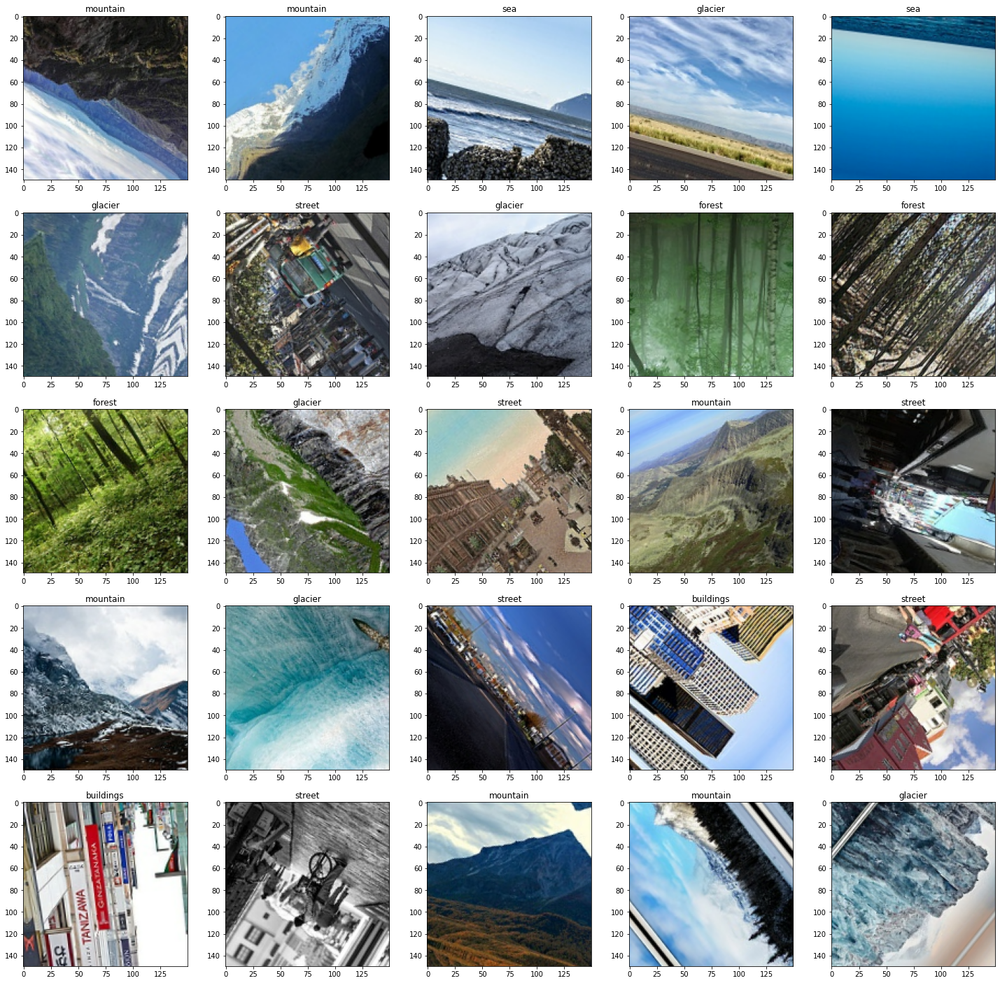

In [38]:
images, labels = next(iter(train_ds))

fig, ax = plt.subplots(5,5,figsize=(25,25))

for index, a in enumerate(fig.axes):
  aug_image = augment_layer(tf.expand_dims(images[index],0)) #add a batch shape -- (150,150,3) --> (1,150,150,3)
  a.imshow(np.array(aug_image[0],dtype=np.uint8))
  a.title.set_text(class_names[labels[index]])

plt.show()

## Vgg-19

### Download Base Model

In [39]:
### Download Base Model
base_model_vgg19 = tf.keras.applications.vgg19.VGG19(include_top=False,weights="imagenet",input_shape=None)

80142336/80134624 [==============================] - 1s 0us/step


### Get Model's Preprocessing Function

In [40]:
vgg19_preprocess = tf.keras.applications.vgg19.preprocess_input

### Visualize Outputs of Model's Preprocessing Function

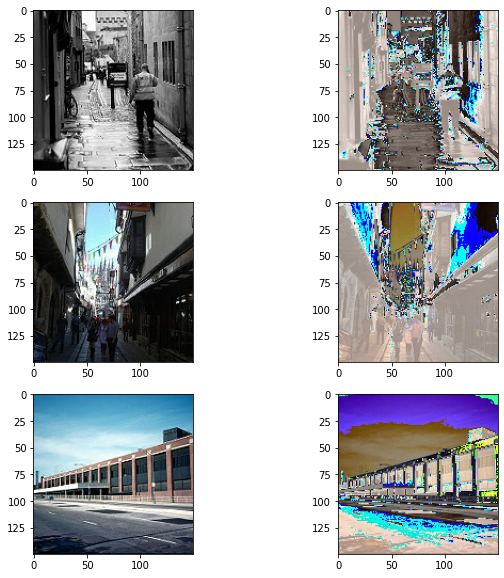

In [41]:
### visuaize the preprocessed input
image_batch, label_batch = next(iter(train_ds))
preprocessed_image_batch = vgg19_preprocess(image_batch)

fig, ax = plt.subplots(3,2,figsize=(10,10))

ax[0,0].imshow(np.array(image_batch[0],dtype=np.uint8))
ax[0,1].imshow(np.array(preprocessed_image_batch[0],dtype=np.uint8))

ax[1,0].imshow(np.array(image_batch[1],dtype=np.uint8))
ax[1,1].imshow(np.array(preprocessed_image_batch[1],dtype=np.uint8))

ax[2,0].imshow(np.array(image_batch[2],dtype=np.uint8))
ax[2,1].imshow(np.array(preprocessed_image_batch[2],dtype=np.uint8))

plt.show()

In [42]:
base_model_vgg19.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

### See output shape of base layer


In [43]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT,IMG_WIDTH)+(3,))
x = augment_layer (inputs)
x = vgg19_preprocess(x)
outputs = base_model_vgg19(x)
model_vgg19 = tf.keras.Model(inputs,outputs)

In [44]:
predictions = model_vgg19(image_batch)

In [45]:
predictions.shape

TensorShape([32, 4, 4, 512])

The outputs shape of base layer is 4, 4, 512. In order generate predictions from 4x4 spatial feature, a global pooling layer must be used

### Create a transfer learning model using Functional API

In [46]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT,IMG_WIDTH)+(3,))
x = augment_layer(inputs)
x = vgg19_preprocess(x)
x = base_model_vgg19(x)
x = tf.keras.layers.GlobalAveragePooling2D() (x)
outputs = tf.keras.layers.Dense(units=len(class_names),activation='softmax')(x)
model_vgg19 = tf.keras.Model(inputs,outputs)

In [47]:
model_vgg19.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 150, 150, 3)       0         
_________________________________________________________________
tf.__operators__.getitem_1 ( (None, 150, 150, 3)       0         
_________________________________________________________________
tf.nn.bias_add_1 (TFOpLambda (None, 150, 150, 3)       0         
_________________________________________________________________
vgg19 (Functional)           (None, None, None, 512)   20024384  
_________________________________________________________________
global_average_pooling2d (Gl (None, 512)               0         
_________________________________________________________________
dense (Dense)                (None, 6)                 3078

### Fine Tune Model

Train few layers of the frozen pretained model to 
improve performance

In [48]:
##un-freeze all layers 
base_model_vgg19.trainable = True

In [49]:
len(base_model_vgg19.layers)

22

In [50]:
#fine tune from this layers onwards
fine_tune_at = 12

In [51]:
# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model_vgg19.layers[0:fine_tune_at]:
  layer.trainable = False

In [52]:
base_model_vgg19.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

**In the summary above,In addition to output layer, now there are trainable params**

### Train Model (Custom Trainning Loop using Gradient Tape)

In [53]:
lr = 0.0001
initial_epochs = 15
loss_function = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
train_loss = tf.keras.metrics.Mean(name='train_loss') #average loss acorss all batchees per epoch
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy') 
valid_loss = tf.keras.metrics.Mean(name='valid_loss')
valid_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='valid_accuracy')
train_f1_score= tfa.metrics.F1Score(num_classes = len(class_names),average='macro',threshold=0.5,name='train_f1_score')
valid_f1_score = tfa.metrics.F1Score(num_classes=len(class_names),average='macro',threshold=0.5,name='valid_f1_score')

In [54]:
@tf.function()
def train_step(images,labels):
  with tf.GradientTape() as tape:
    # training=True is only needed if there are layers with different
    # behavior during training versus inference (e.g. Dropout).
    predictions = model_vgg19(images,training=True)
    loss = loss_function(labels,predictions)

  gradients = tape.gradient(loss,model_vgg19.trainable_variables)
  optimizer.apply_gradients(zip(gradients,model_vgg19.trainable_variables))

  train_loss(loss)
  train_accuracy(labels,predictions)

  class_depth = len(class_names)
  labels_one_hot = tf.one_hot(indices=labels,depth=class_depth)
  predictions_categorical = tf.argmax(predictions,axis=1)
  predictions_one_hot = tf.one_hot(indices=predictions_categorical,depth=class_depth)
  train_f1_score(labels_one_hot,predictions_one_hot)

In [55]:
@tf.function()
def valid_step(images,labels):
  # training=False is only needed if there are layers with different
  # behavior during training versus inference (e.g. Dropout).

  predictions = model_vgg19(images,training=False)
  loss = loss_function(labels,predictions)

  valid_loss(loss)
  valid_accuracy(labels,predictions)

  class_depth = len(class_names)
  labels_one_hot = tf.one_hot(indices=labels,depth=class_depth)
  predictions_categorical = tf.argmax(predictions,axis=1)
  predictions_one_hot = tf.one_hot(indices=predictions_categorical,depth=class_depth)
  valid_f1_score(labels_one_hot,predictions_one_hot)

In [56]:
Train_Loss = []
Train_Accuracy = []
Train_F1_Score = []

Valid_Loss = []
Valid_Accuracy = []
Valid_F1_Score = []

for epoch in range(0,initial_epochs):

  #Reset metrics at the start of each epoch
  train_loss.reset_states()
  train_accuracy.reset_states()
  train_f1_score.reset_states()
  valid_loss.reset_states()
  valid_accuracy.reset_states()
  valid_f1_score.reset_states()

  for images, labels in train_ds:
    train_step(images,labels)

  for images, labels in valid_ds:
    valid_step(images,labels)

  Train_Loss.append(train_loss.result())
  Train_Accuracy.append(train_accuracy.result())
  Train_F1_Score.append(train_f1_score.result())

  Valid_Loss.append(valid_loss.result())
  Valid_Accuracy.append(valid_accuracy.result())
  Valid_F1_Score.append(valid_f1_score.result())


  print(f'Epoch {epoch+1}\n',
        f'Train_Loss: {train_loss.result()}, ',
        f'Train_Accuracy: {train_accuracy.result()}, ',
        f'Train_F1_Score: {train_f1_score.result()},\n'

        f'Valid_Loss: {valid_loss.result()}, ',
        f'Valid_Accuracy: {valid_accuracy.result()}, '
        f'Valid_F1_Score: {valid_f1_score.result()}, \n')


Epoch 1
 Train_Loss: 0.6948854327201843,  Train_Accuracy: 0.7483967542648315,  Train_F1_Score: 0.7499701380729675,
Valid_Loss: 0.43430808186531067,  Valid_Accuracy: 0.8519999980926514, Valid_F1_Score: 0.8543357849121094, 

Epoch 2
 Train_Loss: 0.4346240162849426,  Train_Accuracy: 0.8448054790496826,  Train_F1_Score: 0.846174955368042,
Valid_Loss: 0.398472398519516,  Valid_Accuracy: 0.8516666889190674, Valid_F1_Score: 0.8549704551696777, 

Epoch 3
 Train_Loss: 0.38972392678260803,  Train_Accuracy: 0.8598403930664062,  Train_F1_Score: 0.8611197471618652,
Valid_Loss: 0.34979215264320374,  Valid_Accuracy: 0.8790000081062317, Valid_F1_Score: 0.8805160522460938, 

Epoch 4
 Train_Loss: 0.35392287373542786,  Train_Accuracy: 0.8758016228675842,  Train_F1_Score: 0.8769705295562744,
Valid_Loss: 0.3199407458305359,  Valid_Accuracy: 0.8863333463668823, Valid_F1_Score: 0.8882356286048889, 

Epoch 5
 Train_Loss: 0.3440643846988678,  Train_Accuracy: 0.8769417405128479,  Train_F1_Score: 0.8781843185424

### Plot Learning Curves


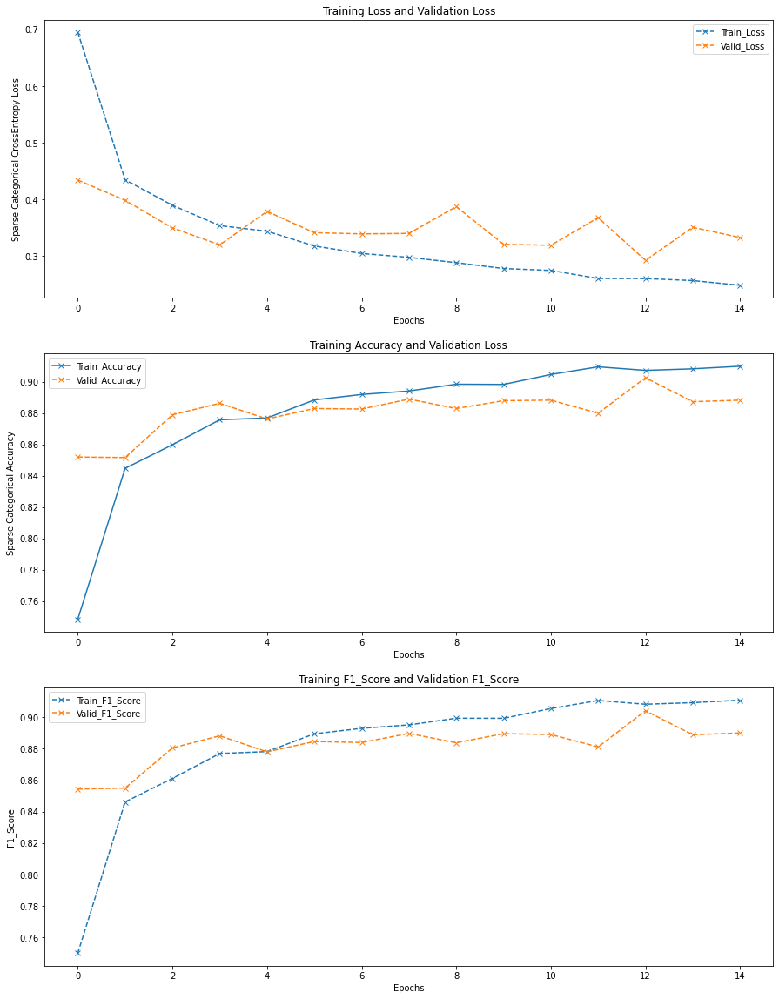

In [57]:
fig, ax = plt.subplots(3,1,figsize=(15,20))

ax[0].plot(Train_Loss,'x--',label="Train_Loss")
ax[0].plot(Valid_Loss,'x--',label="Valid_Loss")
ax[0].title.set_text("Training Loss and Validation Loss")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Sparse Categorical CrossEntropy Loss")
ax[0].legend(loc='best')

ax[1].plot(Train_Accuracy,'x-',label="Train_Accuracy")
ax[1].plot(Valid_Accuracy,'x--',label="Valid_Accuracy")
ax[1].title.set_text("Training Accuracy and Validation Loss")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Sparse Categorical Accuracy")
ax[1].legend(loc='best')

ax[2].plot(Train_F1_Score,'x--',label="Train_F1_Score")
ax[2].plot(Valid_F1_Score,'x--',label="Valid_F1_Score")
ax[2].title.set_text("Training F1_Score and Validation F1_Score")
ax[2].set_xlabel("Epochs")
ax[2].set_ylabel("F1_Score")
ax[2].legend(loc='best')

plt.show()

### Predict On Test Set

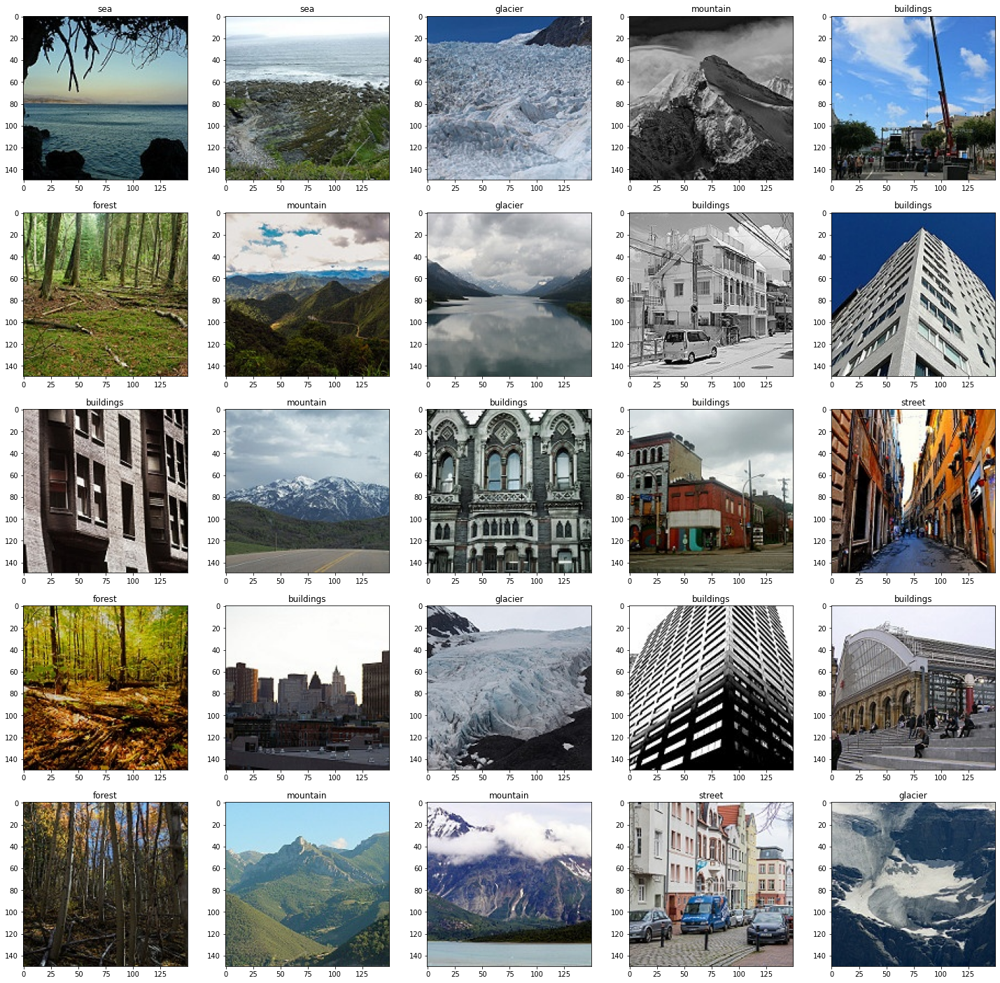

In [58]:
images_test = next(iter(prediction_batch_set))
predictions_test_labels = tf.argmax(model_vgg19.predict(images_test),axis=1)

fig, ax = plt.subplots(5,5,figsize=(25,25))

for index, a in enumerate(fig.axes):
  a.imshow(np.array(images_test[index],dtype=np.uint8))
  a.title.set_text(class_names[predictions_test_labels[index].numpy()])
plt.show()

## Resnet-50

### Download Base Model

In [59]:
#download mobile net and not inlcude the classifcation layers, since the task perfomed here will be differnt to pretained model
base_model_resnet50 = tf.keras.applications.resnet50.ResNet50(include_top=False,
                                                      weights='imagenet',
                                                      input_shape=None)

94773248/94765736 [==============================] - 1s 0us/step


### Get Model's Preprocessing Function

In [60]:
resnet50_v2_preprocessing = tf.keras.applications.resnet_v2.preprocess_input

### Visualize ouputs of Model's Preprocessing Function

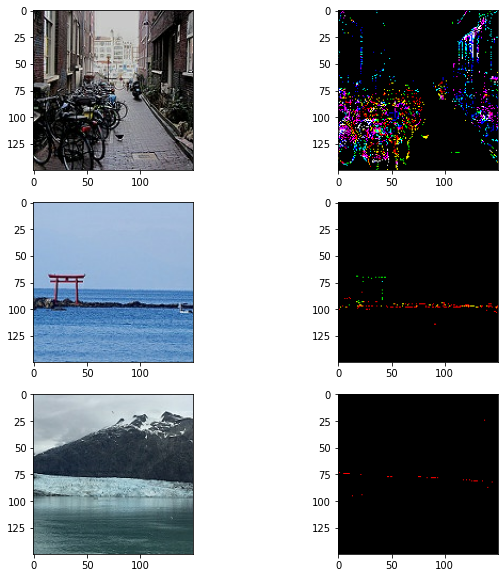

In [61]:
image_batch, label_batch = next(iter(train_ds))
preprocessed_image_batch = resnet50_v2_preprocessing(image_batch)

fig, ax = plt.subplots(3,2,figsize=(10,10))

ax[0,0].imshow(np.array(image_batch[0],dtype=np.uint8))
ax[0,1].imshow(np.array(preprocessed_image_batch[0],dtype=np.uint8))

ax[1,0].imshow(np.array(image_batch[1],dtype=np.uint8))
ax[1,1].imshow(np.array(preprocessed_image_batch[1],dtype=np.uint8))

ax[2,0].imshow(np.array(image_batch[2],dtype=np.uint8))
ax[2,1].imshow(np.array(preprocessed_image_batch[2],dtype=np.uint8))

plt.show()

In [62]:
base_model_resnet50.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, None, None, 6 256         conv1_conv[0][0]                 
___________________________________________________________________________________________

### See output shape of base layer


In [63]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT,IMG_WIDTH)+(3,))
x = resnet50_v2_preprocessing(inputs)
outputs = base_model_resnet50(x)
model_resnet50 = tf.keras.Model(inputs,outputs)

In [64]:
predictions = model_resnet50(image_batch)

In [65]:
predictions.shape

TensorShape([32, 5, 5, 2048])

The outputs shape of base layer is 5, 5, 2048. In order generate predictions from 5x5 spatial feature, a global pooling layer must be used

### Create a transfer learning model using Functional API

In [66]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT,IMG_WIDTH)+(3,))
x = augment_layer(inputs)
x = resnet50_v2_preprocessing(x)
x = base_model_resnet50(x)
x = tf.keras.layers.GlobalAveragePooling2D() (x)
outputs = tf.keras.layers.Dense(units=len(class_names),activation='softmax')(x)
model_resnet50 = tf.keras.Model(inputs,outputs)

In [67]:
model_resnet50.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 150, 150, 3)       0         
_________________________________________________________________
tf.math.truediv_1 (TFOpLambd (None, 150, 150, 3)       0         
_________________________________________________________________
tf.math.subtract_1 (TFOpLamb (None, 150, 150, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, None, None, 2048)  23587712  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 6)                 1229

**In the summary above,In addition to output layer, now there are trainable params**

### Fine Tune Model

Train few layers of the frozen pretained model to 
improve performance

In [68]:
##un-freeze all layers 
model_resnet50.trainable = True

In [69]:
#view the number of layers in model
len(base_model_resnet50.layers)

175

In [70]:
#fine tune from this layers onwards
fine_tune_at = 100

In [71]:
# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model_resnet50.layers[0:fine_tune_at]:
  layer.trainable = False

In [72]:
model_resnet50.summary()

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 150, 150, 3)       0         
_________________________________________________________________
tf.math.truediv_1 (TFOpLambd (None, 150, 150, 3)       0         
_________________________________________________________________
tf.math.subtract_1 (TFOpLamb (None, 150, 150, 3)       0         
_________________________________________________________________
resnet50 (Functional)        (None, None, None, 2048)  23587712  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 6)                 1229

### Train Model (Custom Trainning Loop using Gradient Tape)

In [73]:
lr = 0.0001
initial_epochs = 15
loss_function = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
train_loss = tf.keras.metrics.Mean(name='train_loss') #average loss acorss all batchees per epoch
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy') 
valid_loss = tf.keras.metrics.Mean(name='valid_loss')
valid_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='valid_accuracy')
train_f1_score= tfa.metrics.F1Score(num_classes = len(class_names),average='macro',threshold=0.5,name='train_f1_score')
valid_f1_score = tfa.metrics.F1Score(num_classes=len(class_names),average='macro',threshold=0.5,name='valid_f1_score')

In [74]:
@tf.function()
def train_step(images,labels):
  with tf.GradientTape() as tape:
    # training=True is only needed if there are layers with different
    # behavior during training versus inference (e.g. Dropout).
    predictions = model_resnet50(images,training=True)
    loss = loss_function(labels,predictions)

  gradients = tape.gradient(loss,model_resnet50.trainable_variables)
  optimizer.apply_gradients(zip(gradients,model_resnet50.trainable_variables))

  train_loss(loss)
  train_accuracy(labels,predictions)

  class_depth = len(class_names)
  labels_one_hot = tf.one_hot(indices=labels,depth=class_depth)
  predictions_categorical = tf.argmax(predictions,axis=1)
  predictions_one_hot = tf.one_hot(indices=predictions_categorical,depth=class_depth)
  train_f1_score(labels_one_hot,predictions_one_hot)

In [75]:
@tf.function()
def valid_step(images,labels):
  # training=False is only needed if there are layers with different
  # behavior during training versus inference (e.g. Dropout).

  predictions = model_resnet50(images,training=False)
  loss = loss_function(labels,predictions)

  valid_loss(loss)
  valid_accuracy(labels,predictions)

  class_depth = len(class_names)
  labels_one_hot = tf.one_hot(indices=labels,depth=class_depth)
  predictions_categorical = tf.argmax(predictions,axis=1)
  predictions_one_hot = tf.one_hot(indices=predictions_categorical,depth=class_depth)
  valid_f1_score(labels_one_hot,predictions_one_hot)

In [76]:
Train_Loss = []
Train_Accuracy = []
Train_F1_Score = []

Valid_Loss = []
Valid_Accuracy = []
Valid_F1_Score = []

for epoch in range(0,initial_epochs):

  #Reset metrics at the start of each epoch
  train_loss.reset_states()
  train_accuracy.reset_states()
  train_f1_score.reset_states()
  valid_loss.reset_states()
  valid_accuracy.reset_states()
  valid_f1_score.reset_states()

  for images, labels in train_ds:
    train_step(images,labels)

  for images, labels in valid_ds:
    valid_step(images,labels)

  Train_Loss.append(train_loss.result())
  Train_Accuracy.append(train_accuracy.result())
  Train_F1_Score.append(train_f1_score.result())

  Valid_Loss.append(valid_loss.result())
  Valid_Accuracy.append(valid_accuracy.result())
  Valid_F1_Score.append(valid_f1_score.result())


  print(f'Epoch {epoch+1}\n',
        f'Train_Loss: {train_loss.result()}, ',
        f'Train_Accuracy: {train_accuracy.result()}, ',
        f'Train_F1_Score: {train_f1_score.result()},\n'

        f'Valid_Loss: {valid_loss.result()}, ',
        f'Valid_Accuracy: {valid_accuracy.result()}, '
        f'Valid_F1_Score: {valid_f1_score.result()}, \n')


Epoch 1
 Train_Loss: 1.19797682762146,  Train_Accuracy: 0.5218754410743713,  Train_F1_Score: 0.5217090249061584,
Valid_Loss: 1.7978272438049316,  Valid_Accuracy: 0.48399999737739563, Valid_F1_Score: 0.4237649440765381, 

Epoch 2
 Train_Loss: 0.9693774580955505,  Train_Accuracy: 0.6192104816436768,  Train_F1_Score: 0.6197028756141663,
Valid_Loss: 1.103402853012085,  Valid_Accuracy: 0.5950000286102295, Valid_F1_Score: 0.5771395564079285, 

Epoch 3
 Train_Loss: 0.8843358159065247,  Train_Accuracy: 0.6561921238899231,  Train_F1_Score: 0.6568687558174133,
Valid_Loss: 0.9823790788650513,  Valid_Accuracy: 0.6330000162124634, Valid_F1_Score: 0.623603343963623, 

Epoch 4
 Train_Loss: 0.8166906833648682,  Train_Accuracy: 0.6898959875106812,  Train_F1_Score: 0.6906071305274963,
Valid_Loss: 0.8725027441978455,  Valid_Accuracy: 0.6643333435058594, Valid_F1_Score: 0.6606621146202087, 

Epoch 5
 Train_Loss: 0.7734411358833313,  Train_Accuracy: 0.7082799077033997,  Train_F1_Score: 0.7089004516601562,


### Plot Learning Curves


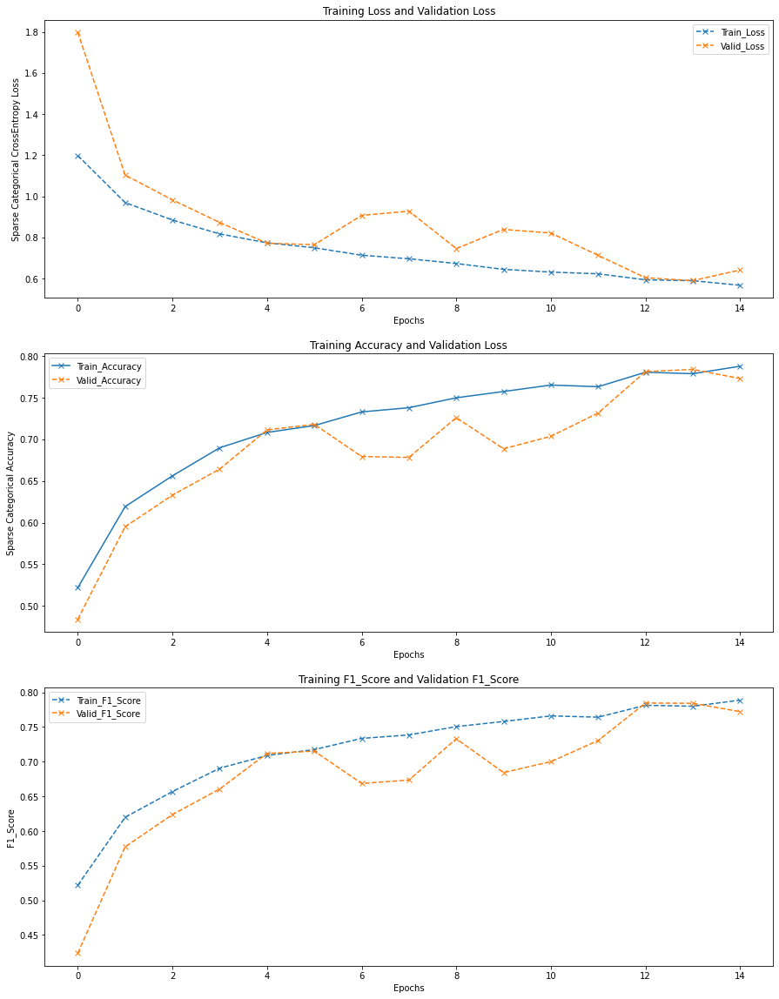

In [77]:
fig, ax = plt.subplots(3,1,figsize=(15,20))

ax[0].plot(Train_Loss,'x--',label="Train_Loss")
ax[0].plot(Valid_Loss,'x--',label="Valid_Loss")
ax[0].title.set_text("Training Loss and Validation Loss")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Sparse Categorical CrossEntropy Loss")
ax[0].legend(loc='best')

ax[1].plot(Train_Accuracy,'x-',label="Train_Accuracy")
ax[1].plot(Valid_Accuracy,'x--',label="Valid_Accuracy")
ax[1].title.set_text("Training Accuracy and Validation Loss")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Sparse Categorical Accuracy")
ax[1].legend(loc='best')

ax[2].plot(Train_F1_Score,'x--',label="Train_F1_Score")
ax[2].plot(Valid_F1_Score,'x--',label="Valid_F1_Score")
ax[2].title.set_text("Training F1_Score and Validation F1_Score")
ax[2].set_xlabel("Epochs")
ax[2].set_ylabel("F1_Score")
ax[2].legend(loc='best')

plt.show()

### Predict On Test Set

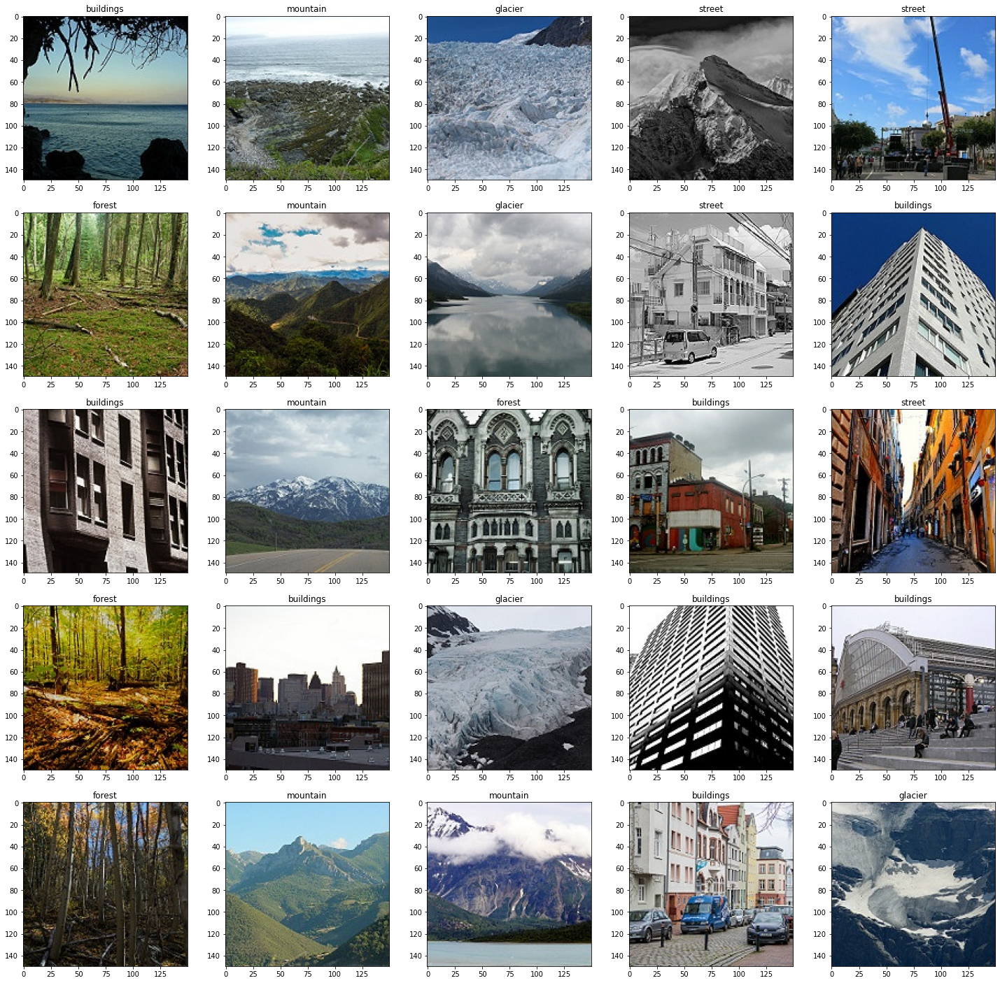

In [78]:
images_test = next(iter(prediction_batch_set))
predictions_test_labels = tf.argmax(model_resnet50.predict(images_test),axis=1)

fig, ax = plt.subplots(5,5,figsize=(25,25))

for index, a in enumerate(fig.axes):
  a.imshow(np.array(images_test[index],dtype=np.uint8))
  a.title.set_text(class_names[predictions_test_labels[index].numpy()])
plt.show()

## Mobile Net V2

### Download Base Model

In [79]:
#download mobile net and not inlcude the classifcation layers, since the task perfomed here will be differnt to pretained model
base_model_mobilenetv2 = tf.keras.applications.mobilenet_v2.MobileNetV2(include_top=False,weights='imagenet',input_shape=None)

9412608/9406464 [==============================] - 0s 0us/step


### Get Model's Preprocessing Function

In [80]:
#every model expects inputs in certain format, use model's preprocessing method to prepare input
mobilenetv2_preprocessing = tf.keras.applications.mobilenet_v2.preprocess_input

### Visualize ouputs of Model's Preprocessing Function

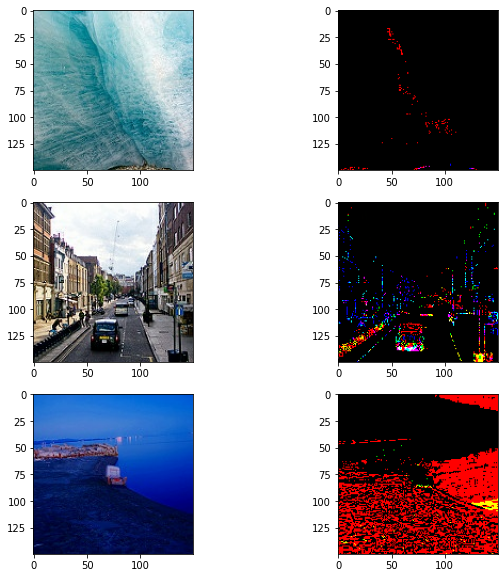

In [81]:
image_batch, label_batch = next(iter(train_ds))
preprocessed_image_batch = mobilenetv2_preprocessing(image_batch)

fig, ax = plt.subplots(3,2,figsize=(10,10))

ax[0,0].imshow(np.array(image_batch[0],dtype=np.uint8))
ax[0,1].imshow(np.array(preprocessed_image_batch[0],dtype=np.uint8))

ax[1,0].imshow(np.array(image_batch[1],dtype=np.uint8))
ax[1,1].imshow(np.array(preprocessed_image_batch[1],dtype=np.uint8))

ax[2,0].imshow(np.array(image_batch[2],dtype=np.uint8))
ax[2,1].imshow(np.array(preprocessed_image_batch[2],dtype=np.uint8))

plt.show()

In [82]:
base_model_mobilenetv2.summary()

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, None, None, 3 864         input_7[0][0]                    
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, None, None, 3 128         Conv1[0][0]                      
__________________________________________________________________________________________________
Conv1_relu (ReLU)               (None, None, None, 3 0           bn_Conv1[0][0]                   
_______________________________________________________________________________

### See output shape of base layer

In [83]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT,IMG_WIDTH)+(3,))
x = mobilenetv2_preprocessing(inputs)
outputs = base_model_mobilenetv2(x)
model_mobilenetv2 = tf.keras.Model(inputs,outputs)

In [84]:
predictions = model_mobilenetv2(image_batch)

In [85]:
predictions.shape

TensorShape([32, 4, 4, 1280])

The outputs shape of base layer is 4, 4, 1280. In order generate predictions from 4x4 spatial feature, a global pooling layer must be used

### Create a transfer learning model using Functional API

In [86]:
inputs = tf.keras.Input(shape=(IMG_HEIGHT,IMG_WIDTH)+(3,))
x = augment_layer(inputs)
x = mobilenetv2_preprocessing(x)
x = base_model_mobilenetv2(x)
x = tf.keras.layers.GlobalAveragePooling2D() (x)
outputs = tf.keras.layers.Dense(units=len(class_names),activation='softmax')(x)
model_mobilenetv2 = tf.keras.Model(inputs,outputs)

In [87]:
model_mobilenetv2.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 150, 150, 3)       0         
_________________________________________________________________
tf.math.truediv_3 (TFOpLambd (None, 150, 150, 3)       0         
_________________________________________________________________
tf.math.subtract_3 (TFOpLamb (None, 150, 150, 3)       0         
_________________________________________________________________
mobilenetv2_1.00_224 (Functi (None, None, None, 1280)  2257984   
_________________________________________________________________
global_average_pooling2d_2 ( (None, 1280)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 6)                 7686

### Fine Tune Model

Train few layers of the frozen, transfer learning model to 
improve performance

In [88]:
##un-freeze all layers 
base_model_mobilenetv2.trainable = True

In [89]:
len(base_model_mobilenetv2.layers)

154

In [90]:
#fine tune from this layers onwards
fine_tune_at = 100

In [91]:
# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model_mobilenetv2.layers[0:fine_tune_at]:
  layer.trainable = False

In [92]:
model_mobilenetv2.summary()

Model: "model_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
sequential (Sequential)      (None, 150, 150, 3)       0         
_________________________________________________________________
tf.math.truediv_3 (TFOpLambd (None, 150, 150, 3)       0         
_________________________________________________________________
tf.math.subtract_3 (TFOpLamb (None, 150, 150, 3)       0         
_________________________________________________________________
mobilenetv2_1.00_224 (Functi (None, None, None, 1280)  2257984   
_________________________________________________________________
global_average_pooling2d_2 ( (None, 1280)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 6)                 7686

**In the summary above,In addition to output layer, now there are trainable params in mobilenet**

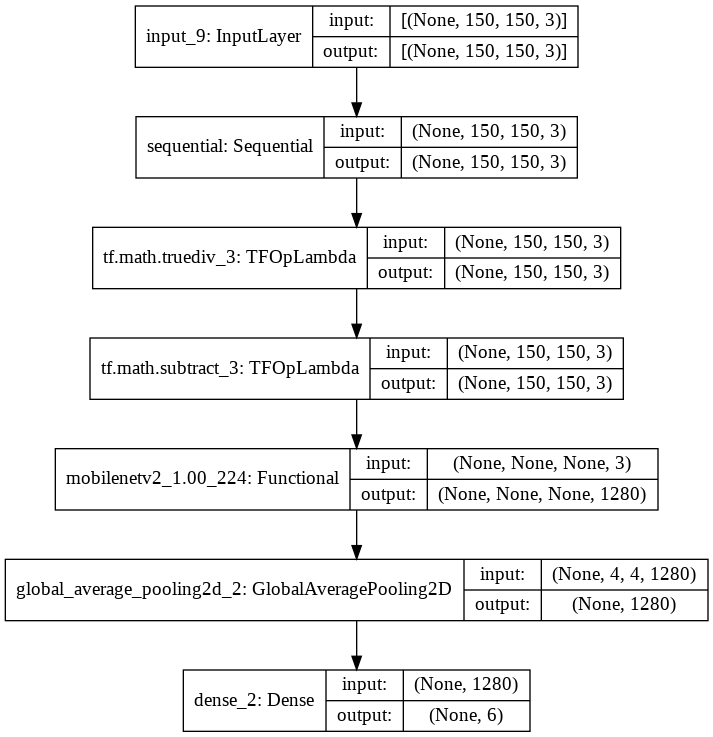

In [93]:
tf.keras.utils.plot_model(model_mobilenetv2,show_shapes=True)

### Train Model (Custom Trainning Loop using Gradient Tape)

In [94]:
lr = 0.0001
initial_epochs = 20
loss_function = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False)
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
train_loss = tf.keras.metrics.Mean(name='train_loss') #average loss acorss all batchees per epoch
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy') 
valid_loss = tf.keras.metrics.Mean(name='valid_loss')
valid_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='valid_accuracy')
train_f1_score= tfa.metrics.F1Score(num_classes = len(class_names), average='macro', threshold=0.5, name='train_f1_score')
valid_f1_score = tfa.metrics.F1Score(num_classes=len(class_names), average='macro', threshold=0.5, name='valid_f1_score')

In [95]:
@tf.function()
def train_step(images,labels):
  with tf.GradientTape() as tape:
    # training=True is only needed if there are layers with different
    # behavior during training versus inference (e.g. Dropout).
    predictions = model_mobilenetv2(images,training=True)
    loss = loss_function(labels,predictions)

  gradients = tape.gradient(loss,model_mobilenetv2.trainable_variables)
  optimizer.apply_gradients(zip(gradients,model_mobilenetv2.trainable_variables))

  train_loss(loss)
  train_accuracy(labels,predictions)

  class_depth = len(class_names)
  labels_one_hot = tf.one_hot(indices=labels,depth=class_depth)
  predictions_categorical = tf.argmax(predictions,axis=1)
  predictions_one_hot = tf.one_hot(indices=predictions_categorical,depth=class_depth)
  train_f1_score(labels_one_hot,predictions_one_hot)

In [96]:
@tf.function()
def valid_step(images,labels):
  # training=False is only needed if there are layers with different
  # behavior during training versus inference (e.g. Dropout).

  predictions = model_mobilenetv2(images,training=False)
  loss = loss_function(labels,predictions)

  valid_loss(loss)
  valid_accuracy(labels,predictions)

  class_depth = len(class_names)
  labels_one_hot = tf.one_hot(indices=labels,depth=class_depth)
  predictions_categorical = tf.argmax(predictions,axis=1)
  predictions_one_hot = tf.one_hot(indices=predictions_categorical,depth=class_depth)
  valid_f1_score(labels_one_hot,predictions_one_hot)

In [97]:
Train_Loss = []
Train_Accuracy = []
Train_F1_Score = []

Valid_Loss = []
Valid_Accuracy = []
Valid_F1_Score = []

for epoch in range(0,initial_epochs):

  #Reset metrics at the start of each epoch
  train_loss.reset_states()
  train_accuracy.reset_states()
  train_f1_score.reset_states()

  valid_loss.reset_states()
  valid_accuracy.reset_states()
  valid_f1_score.reset_states()

  for images, labels in train_ds:
    train_step(images,labels)

  for images, labels in valid_ds:
    valid_step(images,labels)

  Train_Loss.append(train_loss.result())
  Train_Accuracy.append(train_accuracy.result())
  Train_F1_Score.append(train_f1_score.result())

  Valid_Loss.append(valid_loss.result())
  Valid_Accuracy.append(valid_accuracy.result())
  Valid_F1_Score.append(valid_f1_score.result())


  print(f'Epoch {epoch+1}\n',
        f'Train_Loss: {train_loss.result()}, ',
        f'Train_Accuracy: {train_accuracy.result()}, ',
        f'Train_F1_Score: {train_f1_score.result()},\n'

        f'Valid_Loss: {valid_loss.result()}, ',
        f'Valid_Accuracy: {valid_accuracy.result()}, '
        f'Valid_F1_Score: {valid_f1_score.result()}, \n')


Epoch 1
 Train_Loss: 0.5454675555229187,  Train_Accuracy: 0.798845648765564,  Train_F1_Score: 0.8004722595214844,
Valid_Loss: 0.9789521098136902,  Valid_Accuracy: 0.7603333592414856, Valid_F1_Score: 0.7477729916572571, 

Epoch 2
 Train_Loss: 0.34765979647636414,  Train_Accuracy: 0.8739489912986755,  Train_F1_Score: 0.8755731582641602,
Valid_Loss: 0.756979763507843,  Valid_Accuracy: 0.7986666560173035, Valid_F1_Score: 0.8044988512992859, 

Epoch 3
 Train_Loss: 0.3076775372028351,  Train_Accuracy: 0.8906940221786499,  Train_F1_Score: 0.8920090794563293,
Valid_Loss: 0.4382047951221466,  Valid_Accuracy: 0.8560000061988831, Valid_F1_Score: 0.8577781319618225, 

Epoch 4
 Train_Loss: 0.276554137468338,  Train_Accuracy: 0.8979620933532715,  Train_F1_Score: 0.8991820216178894,
Valid_Loss: 0.2816644310951233,  Valid_Accuracy: 0.906000018119812, Valid_F1_Score: 0.9072360992431641, 

Epoch 5
 Train_Loss: 0.26316049695014954,  Train_Accuracy: 0.9020949006080627,  Train_F1_Score: 0.9032707214355469,

### Plot Learning Curves


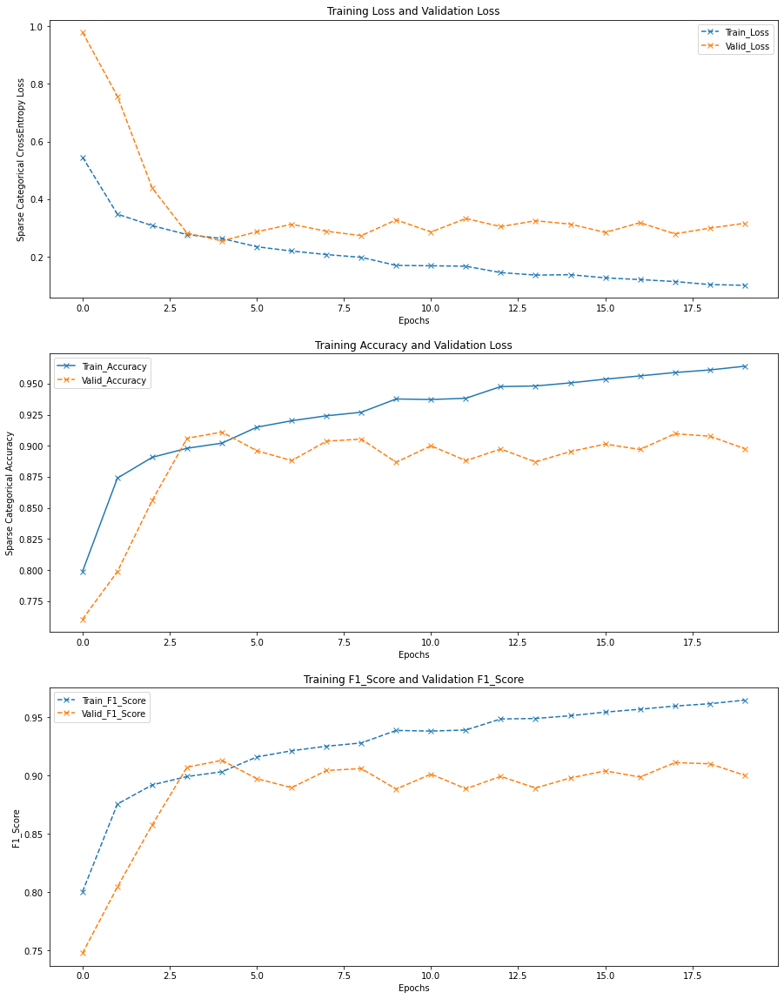

In [98]:
fig, ax = plt.subplots(3,1,figsize=(15,20))

ax[0].plot(Train_Loss,'x--',label="Train_Loss")
ax[0].plot(Valid_Loss,'x--',label="Valid_Loss")
ax[0].title.set_text("Training Loss and Validation Loss")
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Sparse Categorical CrossEntropy Loss")
ax[0].legend(loc='best')

ax[1].plot(Train_Accuracy,'x-',label="Train_Accuracy")
ax[1].plot(Valid_Accuracy,'x--',label="Valid_Accuracy")
ax[1].title.set_text("Training Accuracy and Validation Loss")
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Sparse Categorical Accuracy")
ax[1].legend(loc='best')

ax[2].plot(Train_F1_Score,'x--',label="Train_F1_Score")
ax[2].plot(Valid_F1_Score,'x--',label="Valid_F1_Score")
ax[2].title.set_text("Training F1_Score and Validation F1_Score")
ax[2].set_xlabel("Epochs")
ax[2].set_ylabel("F1_Score")
ax[2].legend(loc='best')

plt.show()

### Predict On Test Set

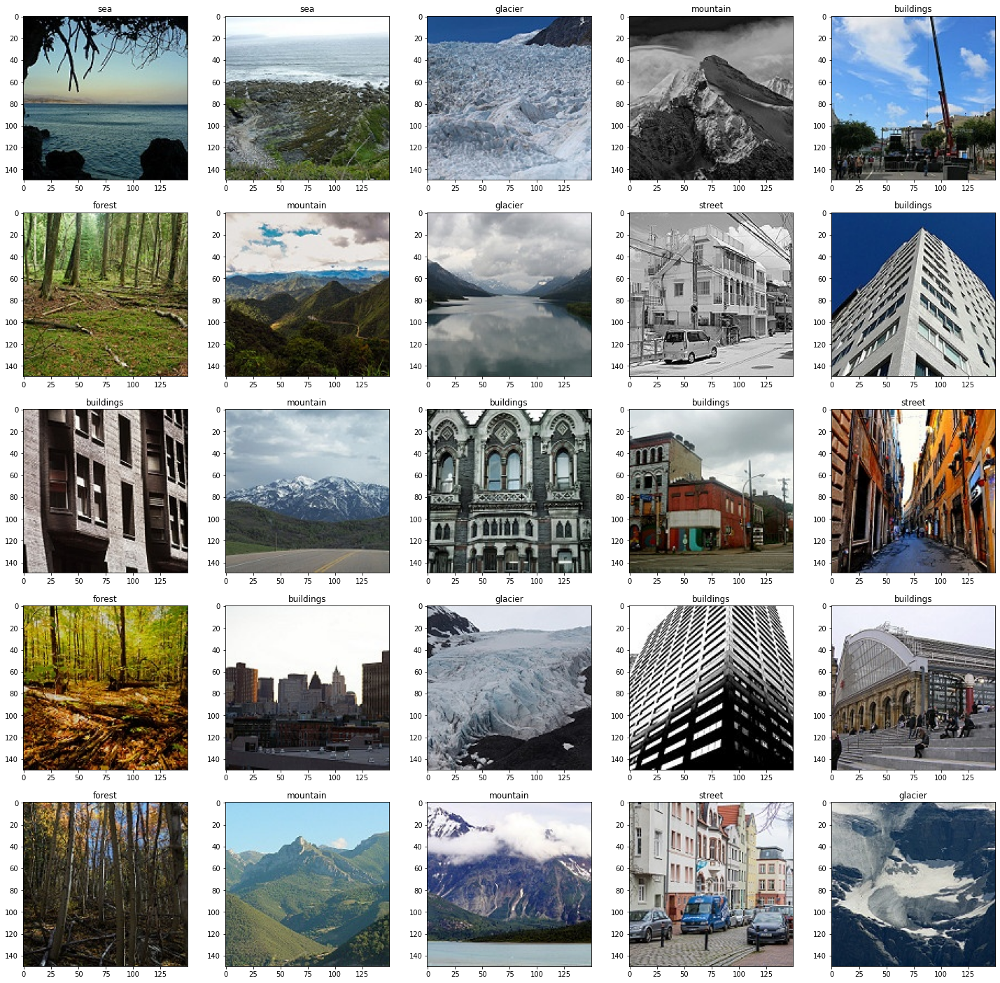

In [99]:
images_test = next(iter(prediction_batch_set))
predictions_test_labels = tf.argmax(model_mobilenetv2.predict(images_test),axis=1)

fig, ax = plt.subplots(5,5,figsize=(25,25))

for index, a in enumerate(fig.axes):
  a.imshow(np.array(images_test[index],dtype=np.uint8))
  a.title.set_text(class_names[predictions_test_labels[index].numpy()])


plt.show()

## Overall Analysis

Model Name| Accuracy(Train Set)| F1_Score(Train Set) | Accuracy(Train Set)| F1_Score(Train Set)
----------|----------|---------|--------|----------
Vgg-19| 91% | 91% | 88% | 89% 
Resnet-50 | 78% | 78% | 77% | 77%
MobileNet-V2 | 96% | 96% | 90% | 91% |

